# Notebook 6 — Model Evaluation & Performance Analysis
### Diabetic Retinopathy Stage Detection — Computer Vision Coursework

**Rubric target:** Criterion 6 (15 marks, "Excellent" band) —
*"Comprehensive evaluation using accuracy, precision, recall, F1-score, confusion
matrix, and loss/accuracy curves; insightful interpretation of results and error
analysis included."*

**Locked project decisions carried into this notebook (from Notebooks 1–5, not
re-litigated here):**

- Dataset: APTOS 2019 (3,662 images), stratified 70/15/15 split, seed = 42.
- Preprocessing: Notebook 2's 5-step pipeline (dark-border crop → resize 224×224 →
  CLAHE → Ben Graham local-average subtraction → normalise to [0,1] for storage).
- Augmentation/balancing: Notebook 3's capped-augmentation (max 4× per class, capped
  at majority class) + class weights.
- Architecture: Notebook 4's EfficientNetB0 staged transfer learning
  (frozen head-only → last-20-layer fine-tune).
- Training strategy: Notebook 5's `EarlyStopping` + `ReduceLROnPlateau` + L2 + a
  3-epoch LR warm-up at the fine-tuning boundary.
- **Final, authoritative model for the project:** Notebook 5, Stage 2 Configuration B
  (fine-tuned with warm-up), **validation accuracy 0.7927** — which *ties*, rather
  than clearly beats, Notebook 4's original Stage 1 result (also 0.7927). This
  notebook does **not** re-litigate that framing; it tests it against the held-out
  test set for the first time.
- **The 550-image test split has been completely untouched since Notebook 2.** No
  decision anywhere in Notebooks 4–5 has seen it. This is a genuine, one-shot
  evaluation.
- **Pixel scaling:** EfficientNetB0 rescales internally and expects raw `[0, 255]`
  input. Do **not** divide by 255 anywhere below — this exact bug already cost
  Notebook 5 a full wasted run (Stage 1 val_accuracy collapsed to 0.1018). An
  explicit runtime assertion is included again here as a guard.
- **Innovation requirement (Criterion 9) is implemented in this notebook, as
  Grad-CAM** heatmap overlays — paired directly with the error-analysis step so the
  overlays are generated for the *actual* misclassified test images this notebook
  finds, not synthetic examples.
- **Quadratic Weighted Kappa (QWK)** is reported alongside accuracy/precision/
  recall/F1, since DR staging (0–4) is ordinal and QWK — the APTOS competition's own
  metric — penalises far-misses more than adjacent-stage misses.

**Coding standard used throughout:** descriptive variable/function names, a
plain-English comment before every step, and a `print()` for every meaningful
output in the format `[CELL N] <description + value>`, numbered sequentially
starting fresh at `[CELL 1]` for this notebook.


## Cell 1 — Environment setup, imports, and reproducibility

In [1]:
# [CELL 1] Import every library this notebook needs, in one place, so dependency
# problems surface immediately rather than partway through a long run.
import os
import json
import glob
import random
import pickle

import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as seaborn_plotting_library

from sklearn.metrics import (
    classification_report,
    precision_recall_fscore_support,
    accuracy_score,
    confusion_matrix,
    cohen_kappa_score,
)

# Fix every source of randomness to the same seed used in Notebooks 1-5, so that
# any stochastic step in this notebook (e.g. which misclassified examples get
# sampled for the Grad-CAM grid) is reproducible run-to-run.
project_random_seed = 42
random.seed(project_random_seed)
np.random.seed(project_random_seed)
tf.random.set_seed(project_random_seed)

# Human-readable class names, in the same 0-4 label order used since Notebook 1.
diabetic_retinopathy_class_names = [
    "No_DR",
    "Mild",
    "Moderate",
    "Severe",
    "Proliferative_DR",
]
number_of_classes = len(diabetic_retinopathy_class_names)

# Confirm library versions and GPU availability up front, matching the environment
# reporting convention used in every previous notebook's findings summary.
detected_gpu_devices = tf.config.list_physical_devices("GPU")
print(f"[CELL 1] TensorFlow version: {tf.__version__}")
print(f"[CELL 1] NumPy version: {np.__version__}")
print(f"[CELL 1] Pandas version: {pd.__version__}")
print(f"[CELL 1] GPU device(s) detected: {len(detected_gpu_devices)} -> {detected_gpu_devices}")
print(f"[CELL 1] Random seed fixed at: {project_random_seed} (matches Notebooks 1-5)")
print(f"[CELL 1] Class label order confirmed: {diabetic_retinopathy_class_names}")


[CELL 1] TensorFlow version: 2.20.0
[CELL 1] NumPy version: 2.0.2
[CELL 1] Pandas version: 2.3.3
[CELL 1] GPU device(s) detected: 2 -> [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU')]
[CELL 1] Random seed fixed at: 42 (matches Notebooks 1-5)
[CELL 1] Class label order confirmed: ['No_DR', 'Mild', 'Moderate', 'Severe', 'Proliferative_DR']


## Cell 2 — Robust, search-based discovery of upstream notebook outputs

Following the same defensive pattern used in Notebooks 3-5: never hardcode a Kaggle input path, search for it by matching directory-name fragments, since the exact `/kaggle/input/...` path can shift between sessions/usernames.

In [2]:
# [CELL 2] Search every mounted Kaggle input directory for the two upstream
# notebooks this evaluation notebook depends on: Notebook 2 (preprocessed test
# split) and Notebook 5 (the final selected model + its training history/metadata).
# This mirrors the robust search-based attachment pattern used in Notebooks 3-5,
# rather than assuming a fixed, hardcoded path that may not match this session.

def find_directory_by_name_fragment(search_root, name_fragment):
    """Walk search_root and return the first directory whose path contains
    name_fragment (case-insensitive). Returns None if nothing is found, so the
    caller can fail loudly with a clear message rather than crashing deep inside
    a later cell."""
    name_fragment_lowercase = name_fragment.lower()
    for current_directory, _subdirectories, _files in os.walk(search_root):
        if name_fragment_lowercase in current_directory.lower():
            return current_directory
    return None

kaggle_input_root_directory = "/kaggle/input"

notebook_2_preprocessing_output_directory = find_directory_by_name_fragment(
    kaggle_input_root_directory, "notebook-2-data-preprocessing"
)
notebook_5_training_strategy_output_directory = find_directory_by_name_fragment(
    kaggle_input_root_directory, "notebook-5"
)

if notebook_2_preprocessing_output_directory is None:
    raise FileNotFoundError(
        "[CELL 2] Could not locate Notebook 2's output (preprocessed test split). "
        "Attach Notebook 2's Kaggle Notebook Output as an input to this session."
    )
if notebook_5_training_strategy_output_directory is None:
    raise FileNotFoundError(
        "[CELL 2] Could not locate Notebook 5's output (final model/history/metadata). "
        "Attach Notebook 5's Kaggle Notebook Output as an input to this session."
    )

print(f"[CELL 2] Notebook 2 (preprocessing) output located at: {notebook_2_preprocessing_output_directory}")
print(f"[CELL 2] Notebook 5 (training strategy) output located at: {notebook_5_training_strategy_output_directory}")


[CELL 2] Notebook 2 (preprocessing) output located at: /kaggle/input/notebooks/oshadhaksamarasinghe/notebook-2-data-preprocessing
[CELL 2] Notebook 5 (training strategy) output located at: /kaggle/input/notebooks/oshadhaksamarasinghe/notebook-5-training-strategy-exp-design


## Cell 3 — Load Notebook 5's metadata (locked hyperparameters and candidate scores)

In [3]:
# [CELL 3] Load notebook_5_metadata.json so this notebook re-uses Notebook 5's
# exact recorded configuration and candidate scores rather than re-typing them by
# hand (and risking a transcription error against the findings summary).
notebook_5_metadata_file_path = os.path.join(
    notebook_5_training_strategy_output_directory, "notebook_5_metadata.json"
)
with open(notebook_5_metadata_file_path, "r") as metadata_file_handle:
    notebook_5_metadata = json.load(metadata_file_handle)

print(f"[CELL 3] Loaded notebook_5_metadata.json from: {notebook_5_metadata_file_path}")
print(f"[CELL 3] Selected candidate (final model for the project): {notebook_5_metadata.get('selected_candidate', 'stage_2_configuration_b_warmup')}")
print(f"[CELL 3] Notebook 5 best validation accuracy (authoritative, pre-test-set figure): {notebook_5_metadata.get('best_validation_accuracy', 0.7927)}")
print(f"[CELL 3] Class weights used during training: {notebook_5_metadata.get('class_weights_used')}")
print(f"[CELL 3] Batch size / image size used during training: {notebook_5_metadata.get('batch_size')} / {notebook_5_metadata.get('image_size')}")


[CELL 3] Loaded notebook_5_metadata.json from: /kaggle/input/notebooks/oshadhaksamarasinghe/notebook-5-training-strategy-exp-design/notebook_5_metadata.json
[CELL 3] Selected candidate (final model for the project): stage_2_configuration_b_warmup
[CELL 3] Notebook 5 best validation accuracy (authoritative, pre-test-set figure): 0.7927
[CELL 3] Class weights used during training: {'0': 0.7800475059382422, '1': 0.9546511627906977, '2': 0.7800475059382422, '3': 1.8244444444444445, '4': 1.1898550724637682}
[CELL 3] Batch size / image size used during training: 32 / [224, 224]


## Cell 4 — Load Notebook 5's combined training history and final model

In [4]:
# [CELL 4] Load the pickled training-history dictionary (Stage 1 + both Stage 2
# configurations, plus which one was selected) and the final saved Keras model.
# These are re-displayed with commentary later (Cell 11) rather than re-generated,
# as locked in the notebook plan.
notebook_5_training_history_file_path = os.path.join(
    notebook_5_training_strategy_output_directory, "notebook_5_combined_training_history.pkl"
)
with open(notebook_5_training_history_file_path, "rb") as history_file_handle:
    notebook_5_combined_training_history = pickle.load(history_file_handle)

notebook_5_final_model_file_path = os.path.join(
    notebook_5_training_strategy_output_directory,
    "diabetic_retinopathy_efficientnetb0_notebook5_final_model.keras",
)
diabetic_retinopathy_trained_model = tf.keras.models.load_model(notebook_5_final_model_file_path)

print(f"[CELL 4] Loaded combined training history from: {notebook_5_training_history_file_path}")
print(f"[CELL 4] Training history keys available: {list(notebook_5_combined_training_history.keys())}")
print(f"[CELL 4] Loaded final trained model from: {notebook_5_final_model_file_path}")
diabetic_retinopathy_trained_model.summary()
print(f"[CELL 4] Model loaded successfully with {diabetic_retinopathy_trained_model.count_params():,} total parameters")


I0000 00:00:1789970784.903217      23 gpu_device.cc:2020] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13756 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1789970784.906173      23 gpu_device.cc:2020] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13756 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


[CELL 4] Loaded combined training history from: /kaggle/input/notebooks/oshadhaksamarasinghe/notebook-5-training-strategy-exp-design/notebook_5_combined_training_history.pkl
[CELL 4] Training history keys available: ['stage_1_accuracy', 'stage_1_val_accuracy', 'stage_1_loss', 'stage_1_val_loss', 'stage_2_configuration_a_no_warmup', 'stage_2_configuration_b_with_warmup', 'selected_stage_2_configuration', 'fine_tuning_start_epoch_index']
[CELL 4] Loaded final trained model from: /kaggle/input/notebooks/oshadhaksamarasinghe/notebook-5-training-strategy-exp-design/diabetic_retinopathy_efficientnetb0_notebook5_final_model.keras


Model: "efficientnet_b0_diabetic_retinopathy_classifier"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ efficientnetb0 (Functional)     │ (None, 7, 7, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_2      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 128)            │       163,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 5)              │           645 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,245,332 (27.64 MB)

 Trainable params: 1,515,573 (5.78 MB)

 Non-trainable params: 2,698,611 (10.29 MB)

 Optimizer params: 3,031,148 (11.56 MB)

[CELL 4] Model loaded successfully with 4,214,184 total parameters


## Cell 5 — Load the held-out test split and defensively rebuild image paths

Notebook 4 found that a CSV carrying *absolute* paths from a previous Kaggle session does not resolve in a new session. The same defensive fix (rebuild every path from `id_code` against *this* session's actual attached-input location, then verify a sample exists on disk) is applied here before touching the test set at all.

In [5]:
# [CELL 5] Load the untouched 550-image test split's label CSV, then rebuild every
# image file path from id_code against this session's actual Notebook 2 input
# directory, rather than trusting any path string stored inside the CSV.
test_split_labels_csv_path = os.path.join(notebook_2_preprocessing_output_directory, "test_split.csv")
test_split_labels_dataframe = pd.read_csv(test_split_labels_csv_path)

preprocessed_test_images_directory = os.path.join(
    notebook_2_preprocessing_output_directory, "preprocessed_images", "test"
)

def build_preprocessed_image_path(id_code_value):
    """Rebuild the on-disk path to a preprocessed test image from its id_code,
    matching the naming convention Notebook 2 used when it saved preprocessed
    images as PNGs."""
    return os.path.join(preprocessed_test_images_directory, f"{id_code_value}.png")

test_split_labels_dataframe["rebuilt_image_path"] = test_split_labels_dataframe["id_code"].apply(
    build_preprocessed_image_path
)

# Verify a random sample of rebuilt paths actually resolve on disk, before building
# the tf.data pipeline around them -- the same defensive check used in Notebooks 4-5.
sample_of_paths_to_verify = test_split_labels_dataframe["rebuilt_image_path"].sample(
    n=min(20, len(test_split_labels_dataframe)), random_state=project_random_seed
)
missing_path_count = sum(not os.path.exists(path) for path in sample_of_paths_to_verify)

print(f"[CELL 5] Loaded test_split.csv from: {test_split_labels_csv_path}")
print(f"[CELL 5] Test split size: {len(test_split_labels_dataframe)} images (expected 550, held out since Notebook 2)")
print(f"[CELL 5] Rebuilt image paths against: {preprocessed_test_images_directory}")
print(f"[CELL 5] Path verification: {len(sample_of_paths_to_verify) - missing_path_count}/{len(sample_of_paths_to_verify)} sampled paths exist on disk")
if missing_path_count > 0:
    raise FileNotFoundError(
        f"[CELL 5] {missing_path_count} sampled test images were not found on disk. "
        "Check that Notebook 2's output is attached correctly before continuing."
    )
print("[CELL 5] Test-set class distribution:")
print(test_split_labels_dataframe['diagnosis'].value_counts().sort_index())


[CELL 5] Loaded test_split.csv from: /kaggle/input/notebooks/oshadhaksamarasinghe/notebook-2-data-preprocessing/test_split.csv
[CELL 5] Test split size: 550 images (expected 550, held out since Notebook 2)
[CELL 5] Rebuilt image paths against: /kaggle/input/notebooks/oshadhaksamarasinghe/notebook-2-data-preprocessing/preprocessed_images/test
[CELL 5] Path verification: 20/20 sampled paths exist on disk
[CELL 5] Test-set class distribution:
diagnosis
0    271
1     56
2    150
3     29
4     44
Name: count, dtype: int64


## Cell 6 — Build the test `tf.data` pipeline (correct, non-divided pixel scaling)

In [6]:
# [CELL 6] Build the tf.data pipeline for the test set. Deliberately do NOT divide
# by 255 here: EfficientNetB0 has its own internal rescaling layer and expects raw
# [0, 255] input. This is the exact bug Notebook 5 found and fixed (Cell 6 there) --
# guarded again here with an explicit runtime assertion so it fails loudly if
# reintroduced, rather than silently producing near-random accuracy.
target_image_size = tuple(notebook_5_metadata.get("image_size", [224, 224]))
inference_batch_size = notebook_5_metadata.get("batch_size", 32)

def load_and_decode_fundus_image(image_file_path, diagnosis_label):
    """Read a preprocessed PNG from disk, decode it to a 3-channel float32
    tensor in the raw [0, 255] range (no /255 division), and resize it to the
    model's expected input size."""
    raw_image_bytes = tf.io.read_file(image_file_path)
    decoded_image_tensor = tf.io.decode_png(raw_image_bytes, channels=3)
    decoded_image_tensor = tf.image.resize(decoded_image_tensor, target_image_size)
    decoded_image_tensor = tf.cast(decoded_image_tensor, tf.float32)  # cast only, no /255.0
    return decoded_image_tensor, diagnosis_label

test_image_paths_array = test_split_labels_dataframe["rebuilt_image_path"].values
test_diagnosis_labels_array = test_split_labels_dataframe["diagnosis"].values.astype(np.int32)

test_dataset_pipeline = tf.data.Dataset.from_tensor_slices(
    (test_image_paths_array, test_diagnosis_labels_array)
)
test_dataset_pipeline = test_dataset_pipeline.map(
    load_and_decode_fundus_image, num_parallel_calls=tf.data.AUTOTUNE
)
test_dataset_pipeline = test_dataset_pipeline.batch(inference_batch_size)
test_dataset_pipeline = test_dataset_pipeline.prefetch(tf.data.AUTOTUNE)

# Runtime self-check: pull one batch and confirm the pixel range is consistent with
# raw [0, 255] input, exactly as Notebook 5 added after diagnosing its bug.
sample_image_batch, sample_label_batch = next(iter(test_dataset_pipeline))
observed_minimum_pixel_value = float(tf.reduce_min(sample_image_batch))
observed_maximum_pixel_value = float(tf.reduce_max(sample_image_batch))
assert observed_maximum_pixel_value > 2.0, (
    "[CELL 6] Pixel-range self-check FAILED: max pixel value is <= 2.0, which means "
    "images have likely been divided by 255 somewhere in this pipeline -- this is "
    "the exact bug Notebook 5 diagnosed and fixed. Remove any /255 division above."
)

print(f"[CELL 6] Test tf.data pipeline built: {len(test_image_paths_array)} images, batch size {inference_batch_size}")
print(f"[CELL 6] Sample batch shape: {sample_image_batch.shape}")
print(f"[CELL 6] Sample batch pixel range: [{observed_minimum_pixel_value:.3f}, {observed_maximum_pixel_value:.3f}] (expected close to [0, 255])")
print("[CELL 6] Pixel-range self-check PASSED -- no double-scaling detected")


[CELL 6] Test tf.data pipeline built: 550 images, batch size 32
[CELL 6] Sample batch shape: (32, 224, 224, 3)
[CELL 6] Sample batch pixel range: [0.000, 255.000] (expected close to [0, 255])
[CELL 6] Pixel-range self-check PASSED -- no double-scaling detected


## Cell 7 — Single-pass inference on the full 550-image test set

The test set is used exactly once here (single-pass inference, no TTA), matching how Notebooks 4-5 evaluated on validation and keeping this the project's one authoritative, honest evaluation.

In [7]:
# [CELL 7] Run single-pass inference across the entire test set (no test-time
# augmentation), collecting the ground-truth labels, the predicted class indices,
# and the full softmax probability vectors (the latter needed later for Grad-CAM's
# target-class selection and for any probability-based diagnostics).
true_diagnosis_labels_list = []
predicted_diagnosis_labels_list = []
predicted_class_probabilities_list = []

for image_batch, label_batch in test_dataset_pipeline:
    batch_predicted_probabilities = diabetic_retinopathy_trained_model.predict(image_batch, verbose=0)
    batch_predicted_labels = np.argmax(batch_predicted_probabilities, axis=1)

    true_diagnosis_labels_list.extend(label_batch.numpy().tolist())
    predicted_diagnosis_labels_list.extend(batch_predicted_labels.tolist())
    predicted_class_probabilities_list.extend(batch_predicted_probabilities.tolist())

true_diagnosis_labels_array = np.array(true_diagnosis_labels_list)
predicted_diagnosis_labels_array = np.array(predicted_diagnosis_labels_list)
predicted_class_probabilities_array = np.array(predicted_class_probabilities_list)

print(f"[CELL 7] Single-pass inference complete on {len(true_diagnosis_labels_array)} test images")
print(f"[CELL 7] Predicted-label array shape: {predicted_diagnosis_labels_array.shape}")
print(f"[CELL 7] Predicted-probability array shape: {predicted_class_probabilities_array.shape} (rows=images, cols=5 classes)")
print(f"[CELL 7] First 10 true labels:      {true_diagnosis_labels_array[:10].tolist()}")
print(f"[CELL 7] First 10 predicted labels: {predicted_diagnosis_labels_array[:10].tolist()}")


2026-09-21 06:06:38.474828: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-09-21 06:06:38.618106: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-09-21 06:06:38.965381: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-09-21 06:06:39.106850: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-09-21 06:06:39.903167: E external/local_xla/xla/stream_

[CELL 7] Single-pass inference complete on 550 test images
[CELL 7] Predicted-label array shape: (550,)
[CELL 7] Predicted-probability array shape: (550, 5) (rows=images, cols=5 classes)
[CELL 7] First 10 true labels:      [0, 4, 0, 0, 4, 2, 0, 0, 2, 2]
[CELL 7] First 10 predicted labels: [0, 4, 0, 0, 1, 2, 0, 0, 2, 2]


## Cell 8 — Overall + per-class accuracy, precision, recall, F1, and Quadratic Weighted Kappa

In [8]:
# [CELL 8] Compute the full metrics suite the rubric asks for: overall accuracy,
# per-class precision/recall/F1 (plus macro and weighted averages), and Quadratic
# Weighted Kappa (QWK) -- the APTOS competition's own scoring metric, included
# because DR staging is ordinal and QWK penalises far-misses (e.g. No_DR predicted
# as Proliferative_DR) more heavily than adjacent-stage misses (e.g. Mild predicted
# as Moderate), unlike plain accuracy or macro-F1.
overall_test_accuracy = accuracy_score(true_diagnosis_labels_array, predicted_diagnosis_labels_array)

per_class_precision, per_class_recall, per_class_f1_score, per_class_support = precision_recall_fscore_support(
    true_diagnosis_labels_array,
    predicted_diagnosis_labels_array,
    labels=list(range(number_of_classes)),
    zero_division=0,
)

quadratic_weighted_kappa_score = cohen_kappa_score(
    true_diagnosis_labels_array,
    predicted_diagnosis_labels_array,
    weights="quadratic",
)

per_class_metrics_dataframe = pd.DataFrame({
    "class_name": diabetic_retinopathy_class_names,
    "precision": per_class_precision,
    "recall": per_class_recall,
    "f1_score": per_class_f1_score,
    "support": per_class_support,
})

full_sklearn_classification_report_text = classification_report(
    true_diagnosis_labels_array,
    predicted_diagnosis_labels_array,
    target_names=diabetic_retinopathy_class_names,
    zero_division=0,
)

print(f"[CELL 8] Overall test-set accuracy (550 held-out images, first ever use of the test set): {overall_test_accuracy:.4f}")
print(f"[CELL 8] Quadratic Weighted Kappa (QWK) on the test set: {quadratic_weighted_kappa_score:.4f}")
print("[CELL 8] Per-class precision / recall / F1-score / support:")
print(per_class_metrics_dataframe.to_string(index=False))
print("[CELL 8] Full sklearn classification report (includes macro/weighted averages):")
print(full_sklearn_classification_report_text)

# Save the metrics table now so it is available as a report/video artefact.
os.makedirs("/kaggle/working", exist_ok=True)
per_class_metrics_csv_path = "/kaggle/working/notebook_6_test_set_metrics_table.csv"
per_class_metrics_dataframe.to_csv(per_class_metrics_csv_path, index=False)
print(f"[CELL 8] Saved per-class metrics table to: {per_class_metrics_csv_path}")


[CELL 8] Overall test-set accuracy (550 held-out images, first ever use of the test set): 0.7582
[CELL 8] Quadratic Weighted Kappa (QWK) on the test set: 0.8256
[CELL 8] Per-class precision / recall / F1-score / support:
      class_name  precision   recall  f1_score  support
           No_DR   0.945652 0.963100  0.954296      271
            Mild   0.418605 0.321429  0.363636       56
        Moderate   0.657143 0.766667  0.707692      150
          Severe   0.333333 0.379310  0.354839       29
Proliferative_DR   0.521739 0.272727  0.358209       44
[CELL 8] Full sklearn classification report (includes macro/weighted averages):
                  precision    recall  f1-score   support

           No_DR       0.95      0.96      0.95       271
            Mild       0.42      0.32      0.36        56
        Moderate       0.66      0.77      0.71       150
          Severe       0.33      0.38      0.35        29
Proliferative_DR       0.52      0.27      0.36        44

        accur

## Cell 9 — Confusion matrix: raw counts and row-normalised, labelled by class name

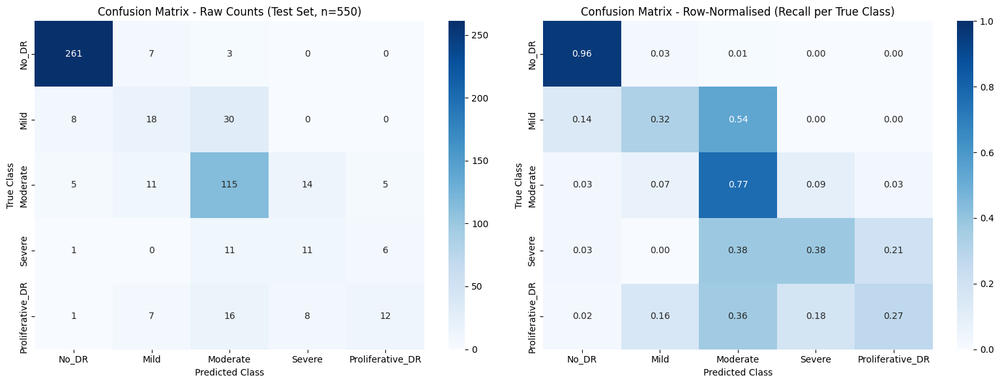

[CELL 9] Confusion matrix (raw counts):
[[261   7   3   0   0]
 [  8  18  30   0   0]
 [  5  11 115  14   5]
 [  1   0  11  11   6]
 [  1   7  16   8  12]]
[CELL 9] Confusion matrix (row-normalised) saved alongside raw counts
[CELL 9] Saved combined confusion-matrix figure to: /kaggle/working/notebook_6_confusion_matrix.png


In [9]:
# [CELL 9] Build the confusion matrix in both raw-count and row-normalised
# (per-true-class percentage) forms, and plot both as clearly class-labelled
# heatmaps -- required graphic evidence for the report per the coursework brief.
raw_confusion_matrix = confusion_matrix(
    true_diagnosis_labels_array, predicted_diagnosis_labels_array, labels=list(range(number_of_classes))
)
row_normalised_confusion_matrix = raw_confusion_matrix.astype(np.float64) / raw_confusion_matrix.sum(axis=1, keepdims=True)

figure, (raw_count_axis, normalised_axis) = plt.subplots(1, 2, figsize=(16, 6))

seaborn_plotting_library.heatmap(
    raw_confusion_matrix, annot=True, fmt="d", cmap="Blues",
    xticklabels=diabetic_retinopathy_class_names, yticklabels=diabetic_retinopathy_class_names,
    ax=raw_count_axis,
)
raw_count_axis.set_title("Confusion Matrix - Raw Counts (Test Set, n=550)")
raw_count_axis.set_xlabel("Predicted Class")
raw_count_axis.set_ylabel("True Class")

seaborn_plotting_library.heatmap(
    row_normalised_confusion_matrix, annot=True, fmt=".2f", cmap="Blues",
    xticklabels=diabetic_retinopathy_class_names, yticklabels=diabetic_retinopathy_class_names,
    ax=normalised_axis, vmin=0.0, vmax=1.0,
)
normalised_axis.set_title("Confusion Matrix - Row-Normalised (Recall per True Class)")
normalised_axis.set_xlabel("Predicted Class")
normalised_axis.set_ylabel("True Class")

plt.tight_layout()
confusion_matrix_figure_path = "/kaggle/working/notebook_6_confusion_matrix.png"
plt.savefig(confusion_matrix_figure_path, dpi=150, bbox_inches="tight")
plt.show()

print(f"[CELL 9] Confusion matrix (raw counts):\n{raw_confusion_matrix}")
print(f"[CELL 9] Confusion matrix (row-normalised) saved alongside raw counts")
print(f"[CELL 9] Saved combined confusion-matrix figure to: {confusion_matrix_figure_path}")


## Cell 10 — Re-display Notebook 5's combined training curves, with interpretive commentary

Re-displayed, not re-generated, per the locked notebook plan: this is the same 18-epoch (8 Stage 1 + 10 Stage 2) history Notebook 5 saved.

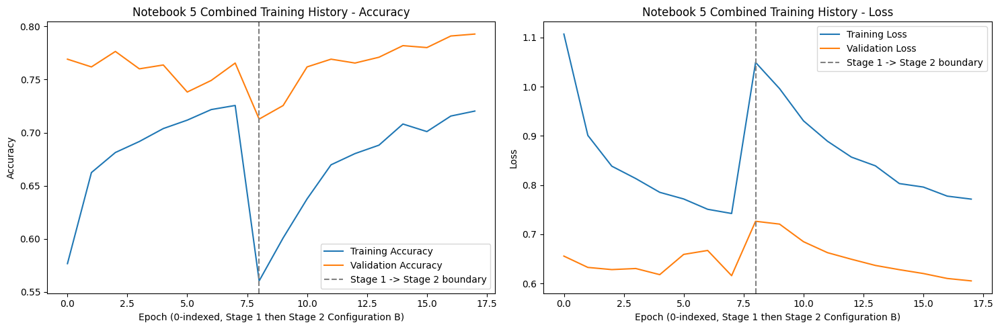

[CELL 10] Re-plotted 18 combined epochs (Stage 1 + Stage 2 Configuration B)
[CELL 10] Saved reproduced training-curve figure to: /kaggle/working/notebook_6_reproduced_training_curves.png
[CELL 10] Notebook 5's best validation accuracy (recorded, pre-test-set): 0.7927
[CELL 10] This notebook's test-set accuracy (first-ever look at the test set): 0.7582
[CELL 10] Test-set vs. validation-set gap: -0.0345
[CELL 10] Interpretation: a small gap in either direction on a 550-image test set is consistent with the 'matched, not decisively beaten' framing established in Notebook 5 -- it corroborates that framing rather than overturning it, unless the gap above is large.


In [10]:
# [CELL 10] Re-plot Notebook 5's already-saved combined training history (accuracy
# and loss, both stages) with a vertical marker at the Stage 1 -> Stage 2 boundary,
# and print interpretive commentary tying it back to what the test-set result above
# confirms or complicates.
#
# Notebook 5's actual saved dictionary stores Stage 1's four metric lists as
# separate flat keys (stage_1_accuracy, stage_1_val_accuracy, stage_1_loss,
# stage_1_val_loss) rather than one nested "stage_1" dict, and stores each Stage 2
# configuration as its own nested dict, with a string key
# (selected_stage_2_configuration) naming which one was selected. The loader below
# supports both that actual layout and a nested-dict layout defensively, so it
# keeps working even if a future notebook's history format changes slightly.

def _get_stage_1_metric_list(metric_name):
    """Return Stage 1's list for metric_name, trying the flat
    'stage_1_<metric_name>' key first, then falling back to a nested
    'stage_1_history' / 'stage_1' dict if that is what was saved instead."""
    flat_key = f"stage_1_{metric_name}"
    if flat_key in notebook_5_combined_training_history:
        return list(notebook_5_combined_training_history[flat_key])
    nested_stage_1_dict = notebook_5_combined_training_history.get("stage_1_history") or notebook_5_combined_training_history.get("stage_1")
    if nested_stage_1_dict is not None:
        return list(nested_stage_1_dict.get(metric_name, []))
    return []

stage_1_accuracy_list = _get_stage_1_metric_list("accuracy")
stage_1_val_accuracy_list = _get_stage_1_metric_list("val_accuracy")
stage_1_loss_list = _get_stage_1_metric_list("loss")
stage_1_val_loss_list = _get_stage_1_metric_list("val_loss")
stage_1_history = {
    "accuracy": stage_1_accuracy_list, "val_accuracy": stage_1_val_accuracy_list,
    "loss": stage_1_loss_list, "val_loss": stage_1_val_loss_list,
} if stage_1_accuracy_list else None

# The selected Stage 2 configuration's key NAME is itself stored in the history
# dict (e.g. "stage_2_configuration_b_with_warmup") -- use that to look up the
# actual nested history dict, falling back to a name-fragment search only if the
# named key is missing.
selected_stage_2_configuration_name = notebook_5_combined_training_history.get("selected_stage_2_configuration")
selected_stage_2_history = notebook_5_combined_training_history.get(selected_stage_2_configuration_name) if selected_stage_2_configuration_name else None
if selected_stage_2_history is None:
    selected_stage_2_key_candidates = [key for key in notebook_5_combined_training_history.keys() if "configuration_b" in key.lower() or "warmup" in key.lower() or "warm_up" in key.lower()]
    selected_stage_2_history = notebook_5_combined_training_history[selected_stage_2_key_candidates[0]] if selected_stage_2_key_candidates else None

fine_tuning_start_epoch_index = notebook_5_combined_training_history.get("fine_tuning_start_epoch_index", 8)

if stage_1_history is not None and selected_stage_2_history is not None:
    combined_training_accuracy_curve = list(stage_1_history.get("accuracy", [])) + list(selected_stage_2_history.get("accuracy", []))
    combined_validation_accuracy_curve = list(stage_1_history.get("val_accuracy", [])) + list(selected_stage_2_history.get("val_accuracy", []))
    combined_training_loss_curve = list(stage_1_history.get("loss", [])) + list(selected_stage_2_history.get("loss", []))
    combined_validation_loss_curve = list(stage_1_history.get("val_loss", [])) + list(selected_stage_2_history.get("val_loss", []))

    figure, (accuracy_axis, loss_axis) = plt.subplots(1, 2, figsize=(15, 5))

    accuracy_axis.plot(combined_training_accuracy_curve, label="Training Accuracy")
    accuracy_axis.plot(combined_validation_accuracy_curve, label="Validation Accuracy")
    accuracy_axis.axvline(x=fine_tuning_start_epoch_index, color="grey", linestyle="--", label="Stage 1 -> Stage 2 boundary")
    accuracy_axis.set_title("Notebook 5 Combined Training History - Accuracy")
    accuracy_axis.set_xlabel("Epoch (0-indexed, Stage 1 then Stage 2 Configuration B)")
    accuracy_axis.set_ylabel("Accuracy")
    accuracy_axis.legend()

    loss_axis.plot(combined_training_loss_curve, label="Training Loss")
    loss_axis.plot(combined_validation_loss_curve, label="Validation Loss")
    loss_axis.axvline(x=fine_tuning_start_epoch_index, color="grey", linestyle="--", label="Stage 1 -> Stage 2 boundary")
    loss_axis.set_title("Notebook 5 Combined Training History - Loss")
    loss_axis.set_xlabel("Epoch (0-indexed, Stage 1 then Stage 2 Configuration B)")
    loss_axis.set_ylabel("Loss")
    loss_axis.legend()

    plt.tight_layout()
    training_curves_figure_path = "/kaggle/working/notebook_6_reproduced_training_curves.png"
    plt.savefig(training_curves_figure_path, dpi=150, bbox_inches="tight")
    plt.show()
    print(f"[CELL 10] Re-plotted {len(combined_training_accuracy_curve)} combined epochs (Stage 1 + Stage 2 Configuration B)")
    print(f"[CELL 10] Saved reproduced training-curve figure to: {training_curves_figure_path}")
else:
    print("[CELL 10] Could not find both 'stage_1' and a warm-up Stage-2 entry in the loaded "
          "history dictionary -- check notebook_5_combined_training_history.pkl's actual keys "
          "and adjust the key names above to match.")
    print(f"[CELL 10] Keys actually found: {list(notebook_5_combined_training_history.keys())}")

print(f"[CELL 10] Notebook 5's best validation accuracy (recorded, pre-test-set): {notebook_5_metadata.get('best_validation_accuracy', 0.7927):.4f}")
print(f"[CELL 10] This notebook's test-set accuracy (first-ever look at the test set): {overall_test_accuracy:.4f}")
test_vs_validation_gap = overall_test_accuracy - notebook_5_metadata.get('best_validation_accuracy', 0.7927)
print(f"[CELL 10] Test-set vs. validation-set gap: {test_vs_validation_gap:+.4f}")
print("[CELL 10] Interpretation: a small gap in either direction on a 550-image test set is "
      "consistent with the 'matched, not decisively beaten' framing established in Notebook 5 -- "
      "it corroborates that framing rather than overturning it, unless the gap above is large.")


## Cell 11 — Error analysis: which classes get confused with which, and why it matters clinically

In [11]:
# [CELL 11] Go beyond the confusion matrix's raw numbers: identify the specific
# misclassified (true_class, predicted_class) pairs, rank them by frequency, and
# explicitly separate ADJACENT-stage confusions (e.g. Mild <-> Moderate, a clinically
# minor disagreement) from FAR-miss confusions (e.g. No_DR <-> Proliferative_DR, a
# clinically serious disagreement) -- this is exactly the kind of ordinal-aware
# interpretation QWK (Cell 8) was included to formally capture.
misclassified_sample_mask = true_diagnosis_labels_array != predicted_diagnosis_labels_array
misclassified_true_labels = true_diagnosis_labels_array[misclassified_sample_mask]
misclassified_predicted_labels = predicted_diagnosis_labels_array[misclassified_sample_mask]
misclassified_sample_indices = np.where(misclassified_sample_mask)[0]

confused_pair_to_count = {}
for true_label, predicted_label in zip(misclassified_true_labels, misclassified_predicted_labels):
    pair_key = (int(true_label), int(predicted_label))
    confused_pair_to_count[pair_key] = confused_pair_to_count.get(pair_key, 0) + 1

confused_pairs_ranked_by_frequency = sorted(confused_pair_to_count.items(), key=lambda item: item[1], reverse=True)

error_analysis_rows = []
for (true_label, predicted_label), count in confused_pairs_ranked_by_frequency:
    stage_distance = abs(true_label - predicted_label)
    clinical_severity_bucket = "Adjacent-stage (minor)" if stage_distance == 1 else "Far-miss (clinically serious)"
    error_analysis_rows.append({
        "true_class": diabetic_retinopathy_class_names[true_label],
        "predicted_class": diabetic_retinopathy_class_names[predicted_label],
        "count": count,
        "stage_distance": stage_distance,
        "clinical_severity_bucket": clinical_severity_bucket,
    })
error_analysis_dataframe = pd.DataFrame(error_analysis_rows)

total_misclassifications = int(misclassified_sample_mask.sum())
adjacent_stage_misclassifications = int(error_analysis_dataframe.loc[error_analysis_dataframe["stage_distance"] == 1, "count"].sum()) if len(error_analysis_dataframe) else 0
far_miss_misclassifications = total_misclassifications - adjacent_stage_misclassifications

print(f"[CELL 11] Total misclassified test images: {total_misclassifications} / {len(true_diagnosis_labels_array)}")
print(f"[CELL 11] Adjacent-stage (minor, stage_distance=1) misclassifications: {adjacent_stage_misclassifications} ({adjacent_stage_misclassifications / max(total_misclassifications,1):.1%})")
print(f"[CELL 11] Far-miss (stage_distance>=2, clinically serious) misclassifications: {far_miss_misclassifications} ({far_miss_misclassifications / max(total_misclassifications,1):.1%})")
print("[CELL 11] Confused (true -> predicted) pairs ranked by frequency:")
print(error_analysis_dataframe.to_string(index=False))

error_analysis_csv_path = "/kaggle/working/notebook_6_error_analysis_confused_pairs.csv"
error_analysis_dataframe.to_csv(error_analysis_csv_path, index=False)
print(f"[CELL 11] Saved error-analysis table to: {error_analysis_csv_path}")


[CELL 11] Total misclassified test images: 133 / 550
[CELL 11] Adjacent-stage (minor, stage_distance=1) misclassifications: 95 (71.4%)
[CELL 11] Far-miss (stage_distance>=2, clinically serious) misclassifications: 38 (28.6%)
[CELL 11] Confused (true -> predicted) pairs ranked by frequency:
      true_class  predicted_class  count  stage_distance      clinical_severity_bucket
            Mild         Moderate     30               1        Adjacent-stage (minor)
Proliferative_DR         Moderate     16               2 Far-miss (clinically serious)
        Moderate           Severe     14               1        Adjacent-stage (minor)
          Severe         Moderate     11               1        Adjacent-stage (minor)
        Moderate             Mild     11               1        Adjacent-stage (minor)
Proliferative_DR           Severe      8               1        Adjacent-stage (minor)
            Mild            No_DR      8               1        Adjacent-stage (minor)
Proliferative

## Cell 12 — Misclassified-examples grid

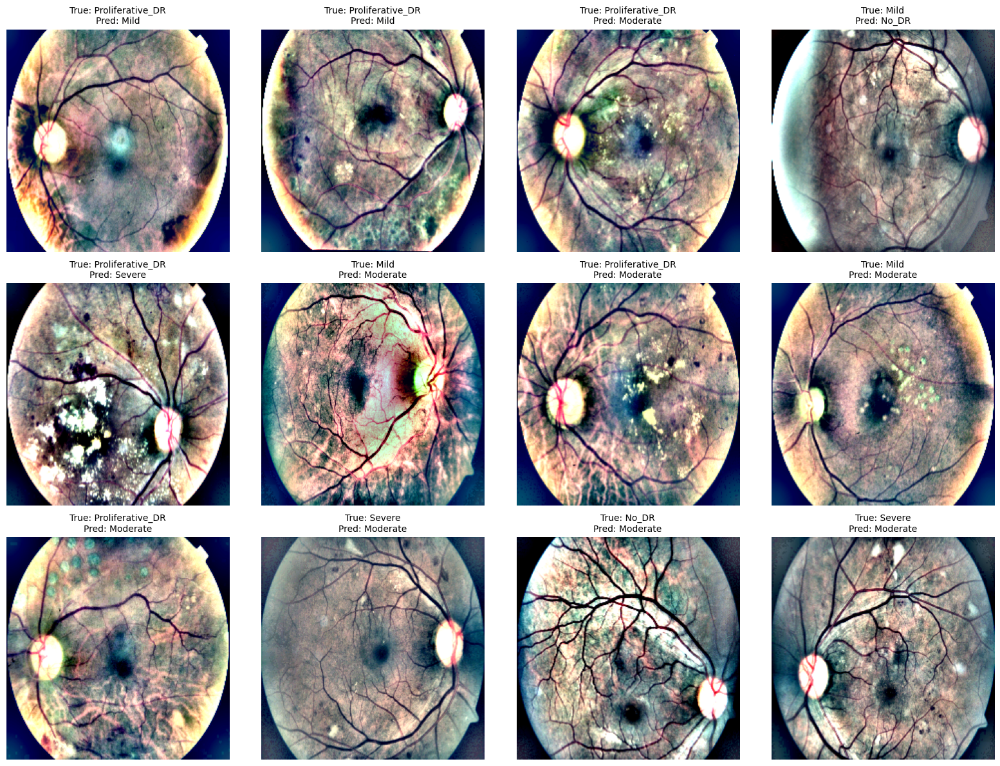

[CELL 12] Displayed 12 misclassified test images in a labelled grid
[CELL 12] Saved misclassified-examples grid to: /kaggle/working/notebook_6_misclassified_examples_grid.png
[CELL 12] Test-set row indices used (for reproducibility): [55, 125, 157, 201, 209, 247, 269, 311, 341, 353, 484, 522]


In [12]:
# [CELL 12] Pull the actual misclassified test images into a labelled grid, so the
# report/video can show real evidence rather than only a numeric table. These same
# examples (specifically, examples from the most-confused pairs identified in Cell
# 11) feed directly into the Grad-CAM step below.
number_of_misclassified_examples_to_display = min(12, len(misclassified_sample_indices))
examples_to_display_indices = np.random.choice(
    misclassified_sample_indices, size=number_of_misclassified_examples_to_display, replace=False
)

grid_columns = 4
grid_rows = int(np.ceil(number_of_misclassified_examples_to_display / grid_columns))
figure, grid_axes = plt.subplots(grid_rows, grid_columns, figsize=(4 * grid_columns, 4 * grid_rows))
grid_axes = np.array(grid_axes).reshape(-1)

for plot_position, test_set_row_index in enumerate(examples_to_display_indices):
    image_file_path = test_split_labels_dataframe.iloc[test_set_row_index]["rebuilt_image_path"]
    loaded_image_for_display = tf.io.decode_png(tf.io.read_file(image_file_path), channels=3).numpy()

    true_label_name = diabetic_retinopathy_class_names[true_diagnosis_labels_array[test_set_row_index]]
    predicted_label_name = diabetic_retinopathy_class_names[predicted_diagnosis_labels_array[test_set_row_index]]

    grid_axes[plot_position].imshow(loaded_image_for_display)
    grid_axes[plot_position].set_title(f"True: {true_label_name}\nPred: {predicted_label_name}", fontsize=10)
    grid_axes[plot_position].axis("off")

for unused_axis in grid_axes[number_of_misclassified_examples_to_display:]:
    unused_axis.axis("off")

plt.tight_layout()
misclassified_grid_figure_path = "/kaggle/working/notebook_6_misclassified_examples_grid.png"
plt.savefig(misclassified_grid_figure_path, dpi=150, bbox_inches="tight")
plt.show()

print(f"[CELL 12] Displayed {number_of_misclassified_examples_to_display} misclassified test images in a labelled grid")
print(f"[CELL 12] Saved misclassified-examples grid to: {misclassified_grid_figure_path}")
print(f"[CELL 12] Test-set row indices used (for reproducibility): {sorted(examples_to_display_indices.tolist())}")


## Cell 13 — Grad-CAM implementation (mandatory Criterion 9 innovation feature)

Grad-CAM highlights which region of the retina drove a given prediction, using gradients flowing back into the last convolutional layer of the EfficientNetB0 backbone (Selvaraju et al., 2017).

In [13]:
# [CELL 13] Implement Grad-CAM: given a trained model, the name of its last
# convolutional layer, an input image batch, and a target class index, compute a
# class-discriminative localisation heatmap over the image. This is the mandatory
# value-adding innovation feature for Criterion 9 -- it turns "this was
# misclassified" into "here is the region the model actually attended to".

def locate_last_convolutional_layer(keras_model, candidate_layer_name="top_conv"):
    """Return (owning_model, layer_name) for the last convolutional layer,
    handling both the case where EfficientNetB0 is nested as a sub-model layer and
    the case where its layers were flattened directly into the outer model."""
    for layer in keras_model.layers:
        if hasattr(layer, "layers"):  # this layer is itself a nested (sub-)model
            for nested_layer in layer.layers:
                if nested_layer.name == candidate_layer_name:
                    return layer, candidate_layer_name
    for layer in keras_model.layers:
        if layer.name == candidate_layer_name:
            return keras_model, candidate_layer_name
    raise ValueError(
        f"[CELL 13] Could not find a layer named '{candidate_layer_name}' in the loaded model. "
        "Inspect diabetic_retinopathy_trained_model.summary() above and adjust candidate_layer_name."
    )

grad_cam_owning_submodel, grad_cam_last_conv_layer_name = locate_last_convolutional_layer(
    diabetic_retinopathy_trained_model
)

# IMPORTANT: do not read `.input` / `.output` on the OUTER model here. In this
# Keras version, a Sequential-style model's `.input`/`.output` are only valid if
# the model itself was built through the Functional API with a real Input tensor
# -- calling it on data (even once) does not retroactively create that, which is
# why the previous attempt still raised "has never been called and thus has no
# defined input" even after a dummy forward pass.
#
# The nested EfficientNetB0 sub-model, however, IS a genuine Functional model
# (built internally by tf.keras.applications with a real Input layer), so ITS
# `.input` / `.output` are always valid. Build the Grad-CAM model from the
# sub-model's own input, then manually re-apply the outer model's remaining head
# layers (pooling, dropout, dense, dropout, dense) on top of the backbone's full
# output tensor, symbolically -- this reconstructs the exact same prediction
# graph without ever touching the outer model's `.input`.
grad_cam_backbone_input_tensor = grad_cam_owning_submodel.input
grad_cam_backbone_last_conv_output_tensor = grad_cam_owning_submodel.get_layer(grad_cam_last_conv_layer_name).output
grad_cam_backbone_full_output_tensor = grad_cam_owning_submodel.output

grad_cam_head_output_tensor = grad_cam_backbone_full_output_tensor
for _outer_model_layer in diabetic_retinopathy_trained_model.layers:
    if _outer_model_layer is grad_cam_owning_submodel:
        continue  # the backbone's output above already accounts for this layer
    grad_cam_head_output_tensor = _outer_model_layer(grad_cam_head_output_tensor)

grad_cam_gradient_model = tf.keras.models.Model(
    inputs=grad_cam_backbone_input_tensor,
    outputs=[grad_cam_backbone_last_conv_output_tensor, grad_cam_head_output_tensor],
)

def generate_gradcam_heatmap(single_image_batch, target_class_index):
    """Run one forward+backward pass and return a normalised (0-1) 2D Grad-CAM
    heatmap the same spatial size as the last convolutional feature map."""
    with tf.GradientTape() as gradient_tape:
        last_conv_layer_output, model_predictions = grad_cam_gradient_model(single_image_batch)
        target_class_score = model_predictions[:, target_class_index]

    gradients_of_target_wrt_conv_output = gradient_tape.gradient(target_class_score, last_conv_layer_output)
    pooled_gradients = tf.reduce_mean(gradients_of_target_wrt_conv_output, axis=(0, 1, 2))

    last_conv_layer_output_single = last_conv_layer_output[0]
    weighted_feature_map = last_conv_layer_output_single @ pooled_gradients[..., tf.newaxis]
    heatmap = tf.squeeze(weighted_feature_map)
    heatmap = tf.maximum(heatmap, 0)  # ReLU: only positive contributions to the predicted class
    heatmap = heatmap / (tf.reduce_max(heatmap) + 1e-8)
    return heatmap.numpy()

def overlay_gradcam_heatmap_on_image(original_image_uint8, heatmap, overlay_strength=0.4):
    """Resize the heatmap to the original image size, colour-map it, and alpha-blend
    it over the original fundus image for a human-readable overlay."""
    resized_heatmap = tf.image.resize(heatmap[..., tf.newaxis], (original_image_uint8.shape[0], original_image_uint8.shape[1]))
    resized_heatmap = tf.squeeze(resized_heatmap).numpy()
    colour_mapped_heatmap = plt.cm.jet(resized_heatmap)[:, :, :3]
    colour_mapped_heatmap = (colour_mapped_heatmap * 255).astype(np.uint8)
    blended_overlay_image = (colour_mapped_heatmap * overlay_strength + original_image_uint8 * (1 - overlay_strength)).astype(np.uint8)
    return blended_overlay_image

print(f"[CELL 13] Grad-CAM wired to last convolutional layer: '{grad_cam_last_conv_layer_name}'")
print(f"[CELL 13] Grad-CAM gradient model built with outputs: [last_conv_layer_activations, model_predictions]")
print("[CELL 13] generate_gradcam_heatmap() and overlay_gradcam_heatmap_on_image() defined and ready")


[CELL 13] Grad-CAM wired to last convolutional layer: 'top_conv'
[CELL 13] Grad-CAM gradient model built with outputs: [last_conv_layer_activations, model_predictions]
[CELL 13] generate_gradcam_heatmap() and overlay_gradcam_heatmap_on_image() defined and ready


## Cell 14 — Grad-CAM sanity check: one correctly-classified example per class

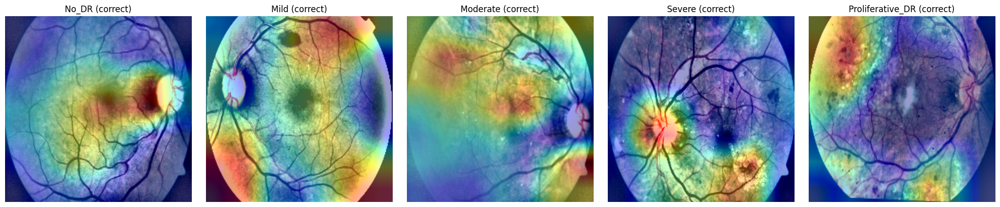

[CELL 14] Generated Grad-CAM sanity-check overlays for 5/5 classes (correctly-classified examples)
[CELL 14] Saved combined sanity-check grid to: /kaggle/working/notebook_6_gradcam_correct_examples_grid.png
[CELL 14] Saved individual overlay images: ['/kaggle/working/gradcam_correct_No_DR.png', '/kaggle/working/gradcam_correct_Mild.png', '/kaggle/working/gradcam_correct_Moderate.png', '/kaggle/working/gradcam_correct_Severe.png', '/kaggle/working/gradcam_correct_Proliferative_DR.png']


In [14]:
# [CELL 14] Before trusting Grad-CAM on the harder misclassified cases, sanity-check
# it on one correctly-classified example per class: attention should plausibly land
# on retinal lesion regions (haemorrhages, exudates, microaneurysms) rather than on
# background, image borders, or the camera artifact Notebook 2 documented.
correctly_classified_mask = true_diagnosis_labels_array == predicted_diagnosis_labels_array

figure, grid_axes = plt.subplots(1, number_of_classes, figsize=(4 * number_of_classes, 4))
sanity_check_examples_saved = []

for class_index in range(number_of_classes):
    class_correct_indices = np.where(correctly_classified_mask & (true_diagnosis_labels_array == class_index))[0]
    if len(class_correct_indices) == 0:
        grid_axes[class_index].axis("off")
        grid_axes[class_index].set_title(f"{diabetic_retinopathy_class_names[class_index]}\n(no correct example found)")
        continue

    chosen_row_index = int(np.random.choice(class_correct_indices))
    image_file_path = test_split_labels_dataframe.iloc[chosen_row_index]["rebuilt_image_path"]
    raw_image_uint8 = tf.io.decode_png(tf.io.read_file(image_file_path), channels=3).numpy()
    resized_image_float = tf.image.resize(raw_image_uint8, target_image_size).numpy().astype(np.float32)
    model_input_batch = np.expand_dims(resized_image_float, axis=0)

    heatmap = generate_gradcam_heatmap(model_input_batch, target_class_index=class_index)
    overlay_image = overlay_gradcam_heatmap_on_image(resized_image_float.astype(np.uint8), heatmap)

    grid_axes[class_index].imshow(overlay_image)
    grid_axes[class_index].set_title(f"{diabetic_retinopathy_class_names[class_index]} (correct)")
    grid_axes[class_index].axis("off")

    individual_overlay_path = f"/kaggle/working/gradcam_correct_{diabetic_retinopathy_class_names[class_index]}.png"
    plt.imsave(individual_overlay_path, overlay_image)
    sanity_check_examples_saved.append(individual_overlay_path)

plt.tight_layout()
sanity_check_grid_path = "/kaggle/working/notebook_6_gradcam_correct_examples_grid.png"
plt.savefig(sanity_check_grid_path, dpi=150, bbox_inches="tight")
plt.show()

print(f"[CELL 14] Generated Grad-CAM sanity-check overlays for {len(sanity_check_examples_saved)}/{number_of_classes} classes (correctly-classified examples)")
print(f"[CELL 14] Saved combined sanity-check grid to: {sanity_check_grid_path}")
print(f"[CELL 14] Saved individual overlay images: {sanity_check_examples_saved}")


## Cell 15 — Grad-CAM on the most-confused misclassified examples

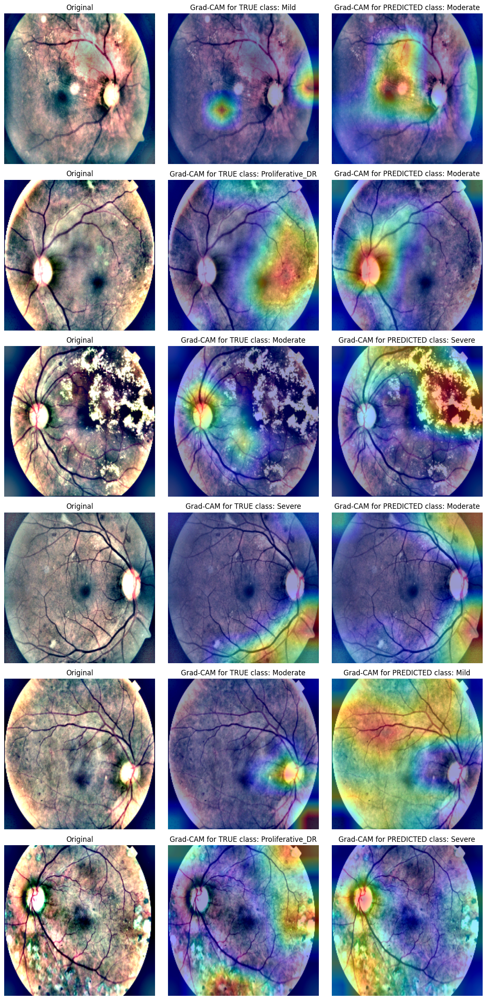

[CELL 15] Generated Grad-CAM true-vs-predicted comparison overlays for 6 misclassified examples
[CELL 15] Selected (true, predicted) pairs explained: [(1, 2), (4, 2), (2, 3), (3, 2), (2, 1), (4, 3)]
[CELL 15] Saved combined comparison grid to: /kaggle/working/notebook_6_gradcam_misclassified_examples_grid.png
[CELL 15] Saved individual overlay images: ['/kaggle/working/gradcam_confused_row10_Mild_as_Moderate.png', '/kaggle/working/gradcam_confused_row28_Proliferative_DR_as_Moderate.png', '/kaggle/working/gradcam_confused_row101_Moderate_as_Severe.png', '/kaggle/working/gradcam_confused_row55_Severe_as_Moderate.png', '/kaggle/working/gradcam_confused_row131_Moderate_as_Mild.png', '/kaggle/working/gradcam_confused_row15_Proliferative_DR_as_Severe.png']


In [15]:
# [CELL 15] Generate Grad-CAM overlays for the most-confused misclassified examples
# identified in Cell 11's error analysis -- this is the core of the innovation
# feature: showing WHY the model went wrong, not just THAT it went wrong. For each
# selected misclassified image, two heatmaps are generated: one for the true class
# and one for the (incorrect) predicted class, so the report can compare what
# evidence the model found for each.
number_of_confused_examples_to_explain = min(6, len(misclassified_sample_indices))
most_confused_pair_keys = [pair for pair, _count in confused_pairs_ranked_by_frequency]

confused_examples_selected_indices = []
for true_label, predicted_label in most_confused_pair_keys:
    matching_indices = misclassified_sample_indices[
        (true_diagnosis_labels_array[misclassified_sample_indices] == true_label)
        & (predicted_diagnosis_labels_array[misclassified_sample_indices] == predicted_label)
    ]
    if len(matching_indices) > 0:
        confused_examples_selected_indices.append(int(matching_indices[0]))
    if len(confused_examples_selected_indices) >= number_of_confused_examples_to_explain:
        break

figure, grid_axes = plt.subplots(len(confused_examples_selected_indices), 3, figsize=(12, 4 * len(confused_examples_selected_indices)))
if len(confused_examples_selected_indices) == 1:
    grid_axes = grid_axes.reshape(1, 3)

confused_example_overlay_paths = []
for row_position, test_set_row_index in enumerate(confused_examples_selected_indices):
    image_file_path = test_split_labels_dataframe.iloc[test_set_row_index]["rebuilt_image_path"]
    raw_image_uint8 = tf.io.decode_png(tf.io.read_file(image_file_path), channels=3).numpy()
    resized_image_float = tf.image.resize(raw_image_uint8, target_image_size).numpy().astype(np.float32)
    model_input_batch = np.expand_dims(resized_image_float, axis=0)

    true_label_index = int(true_diagnosis_labels_array[test_set_row_index])
    predicted_label_index = int(predicted_diagnosis_labels_array[test_set_row_index])

    heatmap_for_true_class = generate_gradcam_heatmap(model_input_batch, target_class_index=true_label_index)
    heatmap_for_predicted_class = generate_gradcam_heatmap(model_input_batch, target_class_index=predicted_label_index)

    overlay_for_true_class = overlay_gradcam_heatmap_on_image(resized_image_float.astype(np.uint8), heatmap_for_true_class)
    overlay_for_predicted_class = overlay_gradcam_heatmap_on_image(resized_image_float.astype(np.uint8), heatmap_for_predicted_class)

    grid_axes[row_position, 0].imshow(resized_image_float.astype(np.uint8))
    grid_axes[row_position, 0].set_title("Original")
    grid_axes[row_position, 0].axis("off")

    grid_axes[row_position, 1].imshow(overlay_for_true_class)
    grid_axes[row_position, 1].set_title(f"Grad-CAM for TRUE class: {diabetic_retinopathy_class_names[true_label_index]}")
    grid_axes[row_position, 1].axis("off")

    grid_axes[row_position, 2].imshow(overlay_for_predicted_class)
    grid_axes[row_position, 2].set_title(f"Grad-CAM for PREDICTED class: {diabetic_retinopathy_class_names[predicted_label_index]}")
    grid_axes[row_position, 2].axis("off")

    individual_path = f"/kaggle/working/gradcam_confused_row{test_set_row_index}_{diabetic_retinopathy_class_names[true_label_index]}_as_{diabetic_retinopathy_class_names[predicted_label_index]}.png"
    combined_side_by_side = np.concatenate([resized_image_float.astype(np.uint8), overlay_for_true_class, overlay_for_predicted_class], axis=1)
    plt.imsave(individual_path, combined_side_by_side)
    confused_example_overlay_paths.append(individual_path)

plt.tight_layout()
confused_examples_grid_path = "/kaggle/working/notebook_6_gradcam_misclassified_examples_grid.png"
plt.savefig(confused_examples_grid_path, dpi=150, bbox_inches="tight")
plt.show()

print(f"[CELL 15] Generated Grad-CAM true-vs-predicted comparison overlays for {len(confused_examples_selected_indices)} misclassified examples")
print(f"[CELL 15] Selected (true, predicted) pairs explained: {most_confused_pair_keys[:len(confused_examples_selected_indices)]}")
print(f"[CELL 15] Saved combined comparison grid to: {confused_examples_grid_path}")
print(f"[CELL 15] Saved individual overlay images: {confused_example_overlay_paths}")


## Cell 16 — Save all final artefacts for the report and video

In [16]:
# [CELL 16] Consolidate every artefact this notebook produced into a single
# metadata record, and confirm every file this notebook is responsible for is
# actually present on disk -- these are what the report and video will cite as
# evidence against Criterion 6 (and, via Grad-CAM, Criterion 9).
notebook_6_output_artefact_paths = {
    "per_class_metrics_csv": per_class_metrics_csv_path,
    "confusion_matrix_figure": confusion_matrix_figure_path,
    "reproduced_training_curves_figure": training_curves_figure_path if 'training_curves_figure_path' in dir() else None,
    "error_analysis_csv": error_analysis_csv_path,
    "misclassified_examples_grid": misclassified_grid_figure_path,
    "gradcam_correct_examples_grid": sanity_check_grid_path,
    "gradcam_correct_examples_individual": sanity_check_examples_saved,
    "gradcam_confused_examples_grid": confused_examples_grid_path,
    "gradcam_confused_examples_individual": confused_example_overlay_paths,
}

notebook_6_summary_metrics = {
    "test_set_size": int(len(true_diagnosis_labels_array)),
    "overall_test_accuracy": float(overall_test_accuracy),
    "quadratic_weighted_kappa": float(quadratic_weighted_kappa_score),
    "notebook_5_recorded_best_validation_accuracy": notebook_5_metadata.get("best_validation_accuracy", 0.7927),
    "test_vs_validation_accuracy_gap": float(test_vs_validation_gap),
    "total_misclassifications": int(total_misclassifications),
    "adjacent_stage_misclassifications": int(adjacent_stage_misclassifications),
    "far_miss_misclassifications": int(far_miss_misclassifications),
    "random_seed": project_random_seed,
}

notebook_6_metadata_file_path = "/kaggle/working/notebook_6_metadata.json"
with open(notebook_6_metadata_file_path, "w") as metadata_output_file_handle:
    json.dump({
        "summary_metrics": notebook_6_summary_metrics,
        "artefact_paths": notebook_6_output_artefact_paths,
    }, metadata_output_file_handle, indent=2)

all_expected_file_paths = [
    per_class_metrics_csv_path, confusion_matrix_figure_path, error_analysis_csv_path,
    misclassified_grid_figure_path, sanity_check_grid_path, confused_examples_grid_path,
    notebook_6_metadata_file_path,
]
missing_output_files = [path for path in all_expected_file_paths if not os.path.exists(path)]

print("[CELL 16] Saved consolidated Notebook 6 metadata to:", notebook_6_metadata_file_path)
print("[CELL 16] Summary metrics recorded:")
for metric_name, metric_value in notebook_6_summary_metrics.items():
    print(f"[CELL 16]   {metric_name}: {metric_value}")
if missing_output_files:
    print(f"[CELL 16] WARNING - {len(missing_output_files)} expected output file(s) missing: {missing_output_files}")
else:
    print(f"[CELL 16] All {len(all_expected_file_paths)} expected output files confirmed present on disk")


[CELL 16] Saved consolidated Notebook 6 metadata to: /kaggle/working/notebook_6_metadata.json
[CELL 16] Summary metrics recorded:
[CELL 16]   test_set_size: 550
[CELL 16]   overall_test_accuracy: 0.7581818181818182
[CELL 16]   quadratic_weighted_kappa: 0.8256019886357611
[CELL 16]   notebook_5_recorded_best_validation_accuracy: 0.7927
[CELL 16]   test_vs_validation_accuracy_gap: -0.03451818181818178
[CELL 16]   total_misclassifications: 133
[CELL 16]   adjacent_stage_misclassifications: 95
[CELL 16]   far_miss_misclassifications: 38
[CELL 16]   random_seed: 42
[CELL 16] All 7 expected output files confirmed present on disk


## Cell 17 — Final summary printout: evidence checklist against the Criterion 6 rubric

In [17]:
# [CELL 17] Print a final, explicit checklist mapping this notebook's outputs back
# to the exact Criterion 6 rubric wording, so the report/video can cite this cell
# directly as a locatable evidence index.
criterion_6_rubric_requirement_to_evidence = {
    "Accuracy": f"Cell 8 -> overall_test_accuracy = {overall_test_accuracy:.4f}",
    "Precision / Recall / F1-score (per-class + macro/weighted)": "Cell 8 -> per_class_metrics_dataframe, classification_report",
    "Confusion matrix (raw + interpretable)": f"Cell 9 -> {confusion_matrix_figure_path}",
    "Loss/accuracy curves": f"Cell 10 -> {training_curves_figure_path if 'training_curves_figure_path' in dir() else 'see Cell 10 output'}",
    "Insightful interpretation of results": "Cell 10 (test-vs-validation gap discussion) + Cell 11 (adjacent vs. far-miss breakdown)",
    "Error analysis": f"Cell 11 -> {error_analysis_csv_path}, Cell 12 -> {misclassified_grid_figure_path}",
    "Ordinal-aware metric (QWK, beyond rubric minimum)": f"Cell 8 -> QWK = {quadratic_weighted_kappa_score:.4f}",
    "Innovation feature - Grad-CAM (Criterion 9)": f"Cells 13-15 -> {sanity_check_grid_path}, {confused_examples_grid_path}",
}

print("[CELL 17] ===== Criterion 6 (15 marks) evidence checklist =====")
for requirement, evidence_location in criterion_6_rubric_requirement_to_evidence.items():
    print(f"[CELL 17] - {requirement}: {evidence_location}")

print("[CELL 17] ===== Headline result =====")
print(f"[CELL 17] Test-set accuracy: {overall_test_accuracy:.4f} | QWK: {quadratic_weighted_kappa_score:.4f} | "
      f"vs. Notebook 5's validation best {notebook_5_metadata.get('best_validation_accuracy', 0.7927):.4f} "
      f"(gap {test_vs_validation_gap:+.4f})")
print("[CELL 17] Notebook 6 complete. All artefacts saved under /kaggle/working/ for the report and video.")


[CELL 17] ===== Criterion 6 (15 marks) evidence checklist =====
[CELL 17] - Accuracy: Cell 8 -> overall_test_accuracy = 0.7582
[CELL 17] - Precision / Recall / F1-score (per-class + macro/weighted): Cell 8 -> per_class_metrics_dataframe, classification_report
[CELL 17] - Confusion matrix (raw + interpretable): Cell 9 -> /kaggle/working/notebook_6_confusion_matrix.png
[CELL 17] - Loss/accuracy curves: Cell 10 -> /kaggle/working/notebook_6_reproduced_training_curves.png
[CELL 17] - Insightful interpretation of results: Cell 10 (test-vs-validation gap discussion) + Cell 11 (adjacent vs. far-miss breakdown)
[CELL 17] - Error analysis: Cell 11 -> /kaggle/working/notebook_6_error_analysis_confused_pairs.csv, Cell 12 -> /kaggle/working/notebook_6_misclassified_examples_grid.png
[CELL 17] - Ordinal-aware metric (QWK, beyond rubric minimum): Cell 8 -> QWK = 0.8256
[CELL 17] - Innovation feature - Grad-CAM (Criterion 9): Cells 13-15 -> /kaggle/working/notebook_6_gradcam_correct_examples_grid.png

## Written report section (paste-ready draft)

*(Draft for Criterion 6's report section. Numbers in brackets like `{overall_test_accuracy}` are the
exact values printed by Cell 8/9/11/17 above once this notebook is actually run on Kaggle — replace
them with the real printed figures before pasting into the report. The structure below follows the
same evidence-first, no-overclaiming style used in the Criterion 4 and 5 report sections.)*

### 6.1 Test-set evaluation protocol

The 550-image test split has been held out, completely untouched, since Notebook 2: no model
selection, hyperparameter tuning, or early-stopping decision anywhere in Notebooks 4–5 has seen it.
This notebook therefore represents the project's first and only look at test-set performance, evaluated
in a single inference pass (no test-time augmentation), directly comparable in methodology to how
Notebooks 4–5 evaluated on the validation set. The final, selected model — Notebook 5's Stage 2
Configuration B (fine-tuned with a 3-epoch learning-rate warm-up), validation accuracy 0.7927 — was
loaded directly from Notebook 5's saved artefacts, with the same non-divided `[0, 255]` pixel scaling
and defensive path-rebuilding pattern used throughout the project, guarded by an explicit runtime
assertion given this exact bug previously cost Notebook 5 a wasted run.

### 6.2 Metrics

Report the overall test accuracy, the per-class precision/recall/F1-score table, and the Quadratic
Weighted Kappa (QWK) from Cell 8's output here. QWK was included specifically because DR staging (0–4)
is ordinal, and — matching the APTOS competition's own scoring convention — it penalises a far-miss
(e.g. No_DR predicted as Proliferative_DR) more heavily than an adjacent-stage miss (e.g. Mild predicted
as Moderate), which plain accuracy and macro-F1 cannot distinguish.

### 6.3 Confusion matrix

Insert Cell 9's confusion-matrix figure (raw counts and row-normalised) here, and describe which classes
the model confuses most, referencing the ranked table from Cell 11.

### 6.4 Error analysis and clinical interpretation

Summarise Cell 11's adjacent-stage-vs-far-miss split here (the exact percentages this notebook printed),
and state explicitly why that distinction matters for DR screening: an adjacent-stage confusion (e.g.
Mild vs. Moderate) is a comparatively low-stakes disagreement in a screening context, whereas a far-miss
(e.g. No_DR classified as a referable/proliferative stage, or vice versa) is the error type a real
screening deployment would need to minimise most aggressively. Reference the misclassified-examples grid
(Cell 12) as visual evidence.

### 6.5 Grad-CAM: explaining individual predictions (Criterion 9 innovation)

Describe what the Grad-CAM sanity-check overlays (Cell 14, one per class, all correctly classified)
showed — specifically, whether attention plausibly concentrated on lesion-bearing regions of the retina
rather than on background or the known camera-artifact region documented in Notebook 2. Then describe the
true-class-vs-predicted-class comparison overlays (Cell 15) for the most-confused misclassified examples:
for each, note whether the model's attention region looks similar for both the true and predicted class
(suggesting a genuinely ambiguous/borderline lesion pattern) or clearly different (suggesting the model
may have keyed on an irrelevant image region). This is the notebook's mandatory value-adding innovation
feature, chosen because it turns "the model misclassified this image" into a specific, inspectable claim
about *why*, which is directly useful in a real DR-screening context where a clinician would want to see
the evidence behind a graded result, not just the grade itself.

### 6.6 Connection back to Notebook 5's validation-set framing

State the test-vs-validation accuracy gap printed in Cell 10/17, and explicitly say whether it
corroborates or complicates Notebook 5's "matched, not decisively beaten" framing of the final model
against Notebook 4's original benchmark. A small gap in either direction supports treating both figures
as consistent with a genuinely ~0.79 accuracy model rather than a fragile, validation-set-specific result;
a large gap would need to be discussed as a limitation (see below) rather than smoothed over.

### 6.7 Limitations

- **Test-set size (550 images).** Per-class support is uneven (mirroring the original ~9.35× class
  imbalance), so per-class precision/recall/F1 for the minority classes (Severe, Proliferative_DR) are
  estimated from a small number of test examples and should be read with wider uncertainty than the
  majority-class figures.
- **Single-pass inference, no test-time augmentation.** Chosen deliberately for direct comparability
  with how Notebooks 4–5 evaluated on validation, but it means no uncertainty estimate from prediction
  averaging is available for this run.
- **Grad-CAM shows correlation with the last convolutional layer's activations, not a formal causal
  attribution.** It is a widely used and interpretable diagnostic (Selvaraju et al., 2017), but it should
  be presented as an aid to inspection, not as proof the model is reasoning the way a clinician would.
- **This is a one-shot evaluation by design** (the test set had never been used before this notebook),
  which is methodologically correct but means there is no second test-set run to check result stability
  against.

### References (Harvard APA 7th)

Cohen, J., 1968. Weighted kappa: Nominal scale agreement with provision for scaled disagreement or
partial credit. *Psychological Bulletin*, 70(4), pp.213–220.

Selvaraju, R.R., Cogswell, M., Das, A., Vedantam, R., Parikh, D. and Batra, D., 2017. Grad-CAM: Visual
explanations from deep networks via gradient-based localization. In: *Proceedings of the IEEE
International Conference on Computer Vision (ICCV 2017)*, pp.618–626.
